# Mapa das estações metereológicas InMet

O Instituto Nacional de Meteorologia - **InMet** - opera uma ampla rede de estações meteorológicas distribuídas por todo o território nacional. Essas estações integram o subsistema de coleta de dados e são equipadas com sensores que medem variáveis ambientais. O sistema completo também inclui unidades de controle e armazenamento, gerenciamento de energia, comunicação, banco de dados e compartilhamento das informações.

As principais variáveis meteorológicas monitoradas são: temperatura, umidade, pressão atmosférica, precipitação, direção e velocidade dos ventos e radiação solar

As estações classificam-se em dois tipos:

* **Convencionais**: requerem um observador para coleta manual dos dados em intervalos predefinidos.

* **Automáticas**: utilizam sensores conectados a um sistema informatizado, que realiza a captura, o armazenamento e o processamento dos dados de forma automática.

A seguir, apresentamos um mapa interativo das estações e uma análise do status operacional por estado e região, elaborada a partir dos catálogos disponíveis em formato **csv** nos seguintes endereços:

**Estações convencionais**: https://portal.inmet.gov.br/paginas/catalogoman#

**Estações automáticas**: https://portal.inmet.gov.br/paginas/catalogoaut#




### Importamos as bibliotecas

In [64]:
import pandas as pd
import numpy as np
from scipy import stats
import geobr
import folium
from folium.plugins import Fullscreen, HeatMap, MarkerCluster
from branca.colormap import LinearColormap
import matplotlib.pyplot as plt
from matplotlib.patches import Circle


### Processamos os arquivos baixados

In [65]:
arquivos = ["CatalogoEstaçõesAutomáticas.csv", "CatalogoEstaçõesConvencionais.csv"]
dataframes = []

for arquivo in arquivos:
    df_temp = pd.read_csv(arquivo,
                            sep=';',
                            header=0,
                            dtype={'DC_NOME': str, 'SG_ESTADO': str, 'CD_SITUACAO': str, 'VL_LATITUDE': str,
                                   'VL_LONGITUDE': str,
                                   'VL_ALTITUDE': str, 'DT_INICIO_OPERACAO': str, 'CD_ESTACAO': str})
    df_temp.columns = ['nome', 'uf', 'situacao', 'latitude', 'longitude', 'altitude', 'dt_inicio_op', 'codigo']
    dataframes.append(df_temp)
    
estacoes = pd.concat(dataframes, ignore_index=True)

estacoes['situacao'] = estacoes['situacao'].map({'Pane': 0, 'Operante': 1})

# Convertemos as colunas numéricas
estacoes['latitude'] = estacoes['latitude'].str.replace(',', '.').astype(float)
estacoes['longitude'] = estacoes['longitude'].str.replace(',', '.').astype(float)
estacoes['altitude'] = estacoes['altitude'].str.replace(',', '.').astype(float)

# Convertemos a coluna 'Data' para o formato datetime
estacoes['dt_inicio_op'] = pd.to_datetime(estacoes['dt_inicio_op'], format='%d/%m/%Y')

### Verificamos uma amostra do dataframe

In [66]:
print(estacoes.head())

             nome  uf  situacao   latitude  longitude  altitude dt_inicio_op  \
0        ABROLHOS  BA         0 -17.963056 -38.703333     20.93   2008-07-20   
1          ACARAU  CE         0  -3.121111 -40.087222     67.15   2009-04-21   
2          ACEGUA  RS         1 -31.874722 -54.119722    271.00   2025-09-16   
3  AFONSO CLAUDIO  ES         1 -20.104167 -41.106944    507.48   2011-09-23   
4        AGUA BOA  MT         1 -14.016389 -52.211667    440.00   2006-12-15   

  codigo  
0   A422  
1   A360  
2   B828  
3   A657  
4   A908  


### Inspecionamos o dataframe

In [67]:
estacoes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   nome          699 non-null    object        
 1   uf            699 non-null    object        
 2   situacao      699 non-null    int64         
 3   latitude      699 non-null    float64       
 4   longitude     699 non-null    float64       
 5   altitude      699 non-null    float64       
 6   dt_inicio_op  699 non-null    datetime64[ns]
 7   codigo        699 non-null    object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 43.8+ KB


### Calculamos a quantidade de estações por tipo

In [68]:
# Separamos as estações por tipo baseado no padrão do código
convencionais = estacoes[estacoes['codigo'].str.match(r'^\d+$')]
automaticas = estacoes[estacoes['codigo'].str.match(r'^[A-Za-z]')]

# Mostramos informações quantitativas sobre os diferentes tipos
print(f"Quantidade de estações convencionais: {len(convencionais)}")
print(f"Quantidade de estações automáticas: {len(automaticas)}")

Quantidade de estações convencionais: 105
Quantidade de estações automáticas: 594


### Calculamos a quantidade de estações por *status* operacional

In [69]:
print("Contagem total por situação:")
print(estacoes['situacao'].value_counts().rename({0: 'Pane', 1: 'Operante'}))

# Ou com percentuais:
total = len(estacoes)
print(f"\nTotal de estações: {total}")
print(f"Operantes: {estacoes['situacao'].sum()} ({(estacoes['situacao'].sum()/total*100):.1f}%)")
print(f"Em pane: {(estacoes['situacao'] == 0).sum()} ({((estacoes['situacao'] == 0).sum()/total*100):.1f}%)")

Contagem total por situação:
situacao
Operante    514
Pane        185
Name: count, dtype: int64

Total de estações: 699
Operantes: 514 (73.5%)
Em pane: 185 (26.5%)


### Agrupamos as estações por UF

In [70]:
contagem_uf = estacoes.groupby('uf').agg(
    total=('situacao', 'count'),
    operantes=('situacao', 'sum'),
    pane=('situacao', lambda x: (x == 0).sum())
).reset_index()

# Adicionando percentuais
contagem_uf['perc_operantes'] = (contagem_uf['operantes'] / contagem_uf['total'] * 100).round(1)
contagem_uf['perc_pane'] = (contagem_uf['pane'] / contagem_uf['total'] * 100).round(1)

print("\nContagem por UF:")
print(contagem_uf.sort_values('total', ascending=False))


Contagem por UF:
    uf  total  operantes  pane  perc_operantes  perc_pane
10  MG     87         78     9            89.7       10.3
22  RS     75         55    20            73.3       26.7
4   BA     53         27    26            50.9       49.1
12  MT     48         30    18            62.5       37.5
13  PA     43         31    12            72.1       27.9
25  SP     42         41     1            97.6        2.4
8   GO     33         30     3            90.9        9.1
18  RJ     31         29     2            93.5        6.5
17  PR     27         18     9            66.7       33.3
11  MS     27         26     1            96.3        3.7
26  TO     26         22     4            84.6       15.4
16  PI     24         11    13            45.8       54.2
23  SC     24         12    12            50.0       50.0
2   AM     23         13    10            56.5       43.5
9   MA     22         15     7            68.2       31.8
5   CE     19          5    14            26.3       7

## Mapas interativos

### Definimos o polígono das unidades da federação

Para definir o polígono das unidades da federação, utilizamos o pacote **geobr**, desenvolvido e mantido pela equipe do **IPEA** - Instituto de Pesquisa Econômica Aplicada, que disponibiliza funções para obter diversas bases de dados espaciais oficiais do Brasil.

(np.float64(-76.24758052684999),
 np.float64(-26.59070825415),
 np.float64(-35.70232894755001),
 np.float64(7.222992030549992))

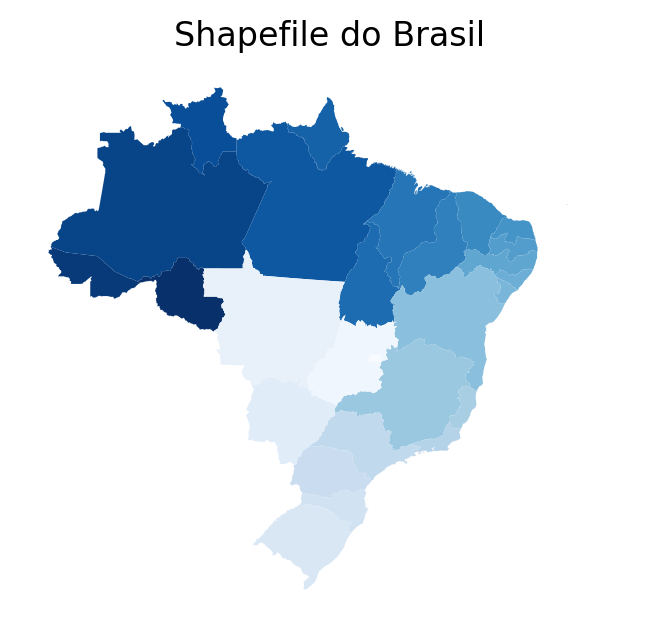

In [71]:
estados = geobr.read_state(year=2019)

fig, ax = plt.subplots(figsize=(4, 4), dpi=200)

estados.plot(
    cmap="Blues_r",
    legend=True,
    legend_kwds={
        "label": "Shapefile do Brasil",
        "orientation": "horizontal",
        "shrink": 0.6,
    },
    ax=ax,
)

ax.set_title("Shapefile do Brasil")
ax.axis("off")

### Conferimos o sistema geodésico de referência

In [72]:
estados.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### Analisamos as características do objeto

O objeto **estados** é um *GeoDataFrame* que armazena dados geoespaciais. Sua coluna geometry contém a representação geográfica das unidades da federação no formato *MULTIPOLYGON*.

In [73]:
print(estados.head())

   code_state abbrev_state name_state  code_region name_region  \
0        11.0           RO   Rondônia          1.0       Norte   
1        12.0           AC       Acre          1.0       Norte   
2        13.0           AM   Amazônas          1.0       Norte   
3        14.0           RR    Roraima          1.0       Norte   
4        15.0           PA       Pará          1.0       Norte   

                                            geometry  
0  MULTIPOLYGON (((-65.3815 -10.42907, -65.37916 ...  
1  MULTIPOLYGON (((-71.07772 -9.82774, -71.08554 ...  
2  MULTIPOLYGON (((-69.83766 -3.68659, -69.7123 -...  
3  MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2...  
4  MULTIPOLYGON (((-51.43248 -0.47334, -51.42843 ...  


In [74]:
print(estados.geometry.geom_type.head())

0    MultiPolygon
1    MultiPolygon
2    MultiPolygon
3    MultiPolygon
4    MultiPolygon
dtype: object


In [75]:
estados.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   code_state    27 non-null     float64 
 1   abbrev_state  27 non-null     object  
 2   name_state    27 non-null     object  
 3   code_region   27 non-null     float64 
 4   name_region   27 non-null     object  
 5   geometry      27 non-null     geometry
dtypes: float64(2), geometry(1), object(3)
memory usage: 1.4+ KB


### Mapa interativo

Utilizamos **Folium**, biblioteca Python para visualização de dados geoespaciais, que funciona como uma interface para a biblioteca JavaScript *Leaflet.js*.

**Primeiro, definimos a função para inicializar o mapa**

Para evitar que novas camadas sejam sobrepostas às anterioes, criamos uma função para reinicializar o objeto *folium.Map* a cada chamada. Calculamos a média das coordenadas para encontrar o centro geográfico ou baricentro do conjunto de pontos.

In [76]:
def initMap():
    tiles = 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png'
    attr = '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors'

    center_lat = estacoes['latitude'].mean()
    center_lon = estacoes['longitude'].mean()

    map = folium.Map(location=[center_lat, center_lon],
                zoom_start = 4,
                tiles = tiles,
                attr = attr,
                control_scale=True)
    return map

**Depois, criamos o mapa básico**

In [77]:
# Centralizamos o mapa
m = initMap()
m

**Adicionamos o polígono como uma camada *json:***

Convertemos o polígono das unidades da federação para o sistema geodésico de referência **ESPSG:4326 (WGS84)**, padrão de entrada do **Folium** para representar camadas vetoriais.

In [78]:
# Adicionamos o polígono como uma camada json
br_geojson = estados.to_crs(epsg=4326).to_json()

folium.GeoJson(
    br_geojson,
    name='Polígono do Brasil',  # Nome que aparecerá no controle
    style_function=lambda x: {
        'fillColor': 'lightblue',
        'color': '#FEBF57',
        'weight': 2,
        'fillOpacity': 0.3
    },
    #tooltip='Brasil'
).add_to(m)
m

**Finalmente, plotamos os pontos de dados:**

Definimos marcadores circulares para identificar, de acordo com o *status* de funcionamento, a localização das estações metereológicas.

In [79]:
# Adicionamos marcadores para cada estação
for idx, row in estacoes.iterrows():
    # Definir cor baseado na situação
    cor = 'green' if row['situacao'] == 1 else 'red'
    
    # Criar popup com informações
    popup_html = f"""
    <div style="font-family: Arial; font-size: 12px;">
        <b>Estação:</b> {row['nome']}<br>
        <b>UF:</b> {row['uf']}<br>
        <b>Situação:</b> {'Operante' if row['situacao'] == 1 else 'Pane'}<br>
        <b>Código:</b> {row['codigo']}<br>
        <b>Altitude:</b> {row['altitude']:.0f} m<br>
        <b>Início operação:</b> {row['dt_inicio_op']}
    </div>
    """
    
    # Adicionar marcador
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=6,
        popup=folium.Popup(popup_html, max_width=300),
        color=cor,
        fill=True,
        fill_color=cor,
        fill_opacity=0.7,
        weight=1
    ).add_to(m)

# Adicionamos plugin de tela cheia
fullscreen_plugin = Fullscreen(
    position='bottomleft',
    title='Expandir tela',
    title_cancel='Sair da tela cheia',
    force_separate_button=True
).add_to(m)

m

# Salvar mapa
#m.save('mapa_estacoes_inmet.html')
#print("Mapa salvo como 'mapa_estacoes_inmet.html'")

### Mapa coroplético por UF

O mapa a seguir exibe o percentual das estações metereológicas operantes por unidade da federação.

**Combinamos os dataframes:**

In [80]:
estados_merged = estados.merge(contagem_uf, left_on='abbrev_state', right_on='uf', how='left')


**Adicionamos a camada coroplética**

Para criar o mapa coroplético, podemos utilizar a classe *folium.Choropleth* ou a classe *folium.GeoJson*. A primeira é mais adequada para casos simples, enquanto a segunda proporciona maior flexibilidade para personalizações avançadas — opção dotada neste caso.

In [81]:
m = initMap()

# Escala de cores de vermelho (pior) para verde (melhor)
colormap = LinearColormap(
    ['red', 'orange', 'yellow', 'lightgreen', 'green'],
    vmin=0, 
    vmax=100,
    caption='Percentual de estações operantes (%)'
)

# Convertemos GeoDataFrame para GeoJSON
estados_merged_json = estados_merged.to_crs(epsg=4326).to_json()

# Adicionamos camada coroplética
folium.GeoJson(
    estados_merged_json,
    name='Percentual operantes por UF',
    style_function=lambda feature: {
        'fillColor': colormap(feature['properties']['perc_operantes']),
        'color': 'black',
        'weight': 1.5,
        'fillOpacity': 0.7,
        'dashArray': '5, 5'
    },
    highlight_function=lambda x: {
        'weight': 3,
        'fillOpacity': 0.9,
        'color': 'white'
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['abbrev_state', 'name_state', 'total', 'operantes', 'perc_operantes', 'perc_pane'],
        aliases=['UF:', 'Estado:', 'Total:', 'Operantes:', '% Operantes:', '% Pane:'],
        localize=True,
        sticky=True,
        labels=True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """
    )
).add_to(m)

# Adicionamos escala de cores ao mapa
colormap.add_to(m)

# Adicionamos controle de camadas
folium.LayerControl().add_to(m)

# Adicionamos título
title_html = '''
    <h3 align="center" style="font-size:16px">
    <b>Percentual de estações meteorológicas operantes por UF</b>
    </h3>
'''
mapa_operantes.get_root().html.add_child(folium.Element(title_html))

# Adicionamos plugin de tela cheia
fullscreen_plugin = Fullscreen(
    position='bottomleft',
    title='Expandir tela',
    title_cancel='Sair da tela cheia',
    force_separate_button=True
).add_to(m)

# Exibimos o mapa
m

### Mapa de densidade das estações

In [84]:
m = initMap()

# Adicionar polígono do Brasil como fundo
folium.GeoJson(
    estados.to_crs(epsg=4326).to_json(),
    name='Limites estaduais',
    style_function=lambda x: {
        'fillColor': 'lightgray',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.1
    },
    tooltip='Brasil'
).add_to(m)

# Dados para heatmap - todas as estações
heat_data_all = [[row['latitude'], row['longitude'], 1] for idx, row in estacoes.iterrows()]

# Dados para heatmap - apenas estações em pane (intensidade maior)
heat_data_pane = [[row['latitude'], row['longitude'], 2] for idx, row in estacoes[estacoes['situacao'] == 0].iterrows()]

# Adicionar heatmap camada 1: todas as estações
HeatMap(
    heat_data_all,
    name='Todas as estações',
    radius=12,
    blur=10,
    max_zoom=10,
    gradient={0.4: 'blue', 0.65: 'lime', 1: 'yellow'},
    min_opacity=0.5
).add_to(m)

# Adicionar heatmap camada 2: estações em pane (sobreposição)
HeatMap(
    heat_data_pane,
    name='Estações em pane',
    radius=15,
    blur=12,
    max_zoom=10,
    gradient={0.4: 'orange', 0.7: 'red', 1: 'darkred'},
    min_opacity=0.6
).add_to(m)

# Adicionar cluster de marcadores para estações em pane
marker_cluster_pane = MarkerCluster(
    name="Estações em pane (detalhes)",
    icon_create_function=None
).add_to(m)

# Adicionar marcadores para estações em pane
for idx, row in estacoes[estacoes['situacao'] == 0].iterrows():
    popup_html = f"""
    <div style="font-family: Arial; font-size: 12px; width: 250px">
        <h4 style="color: red; margin: 5px 0;">⚠️ ESTAÇÃO EM PANE</h4>
        <b>Estação:</b> {row['nome']}<br>
        <b>UF:</b> {row['uf']}<br>
        <b>Código:</b> {row['codigo']}<br>
        <b>Altitude:</b> {row['altitude']:.0f} m<br>
        <b>Início operação:</b> {row['dt_inicio_op']}<br>
        <hr style="margin: 8px 0;">
        <b>Coordenadas:</b><br>
        Lat: {row['latitude']:.4f}<br>
        Lon: {row['longitude']:.4f}
    </div>
    """
    
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_html, max_width=300),
        icon=folium.Icon(color='red', icon='exclamation-triangle', prefix='fa'),
        tooltip=f"Pane: {row['nome']}"
    ).add_to(marker_cluster_pane)

# Adicionar controles
folium.LayerControl(collapsed=False).add_to(m)

# Adicionar título
title_html = '''
    <h3 align="center" style="font-size:16px">
    <b>Mapa de densidade de estações meteorológicas</b><br>
    <span style="font-size:12px">Amarelo: todas estações | Vermelho: concentração de pane</span>
    </h3>
'''
m.get_root().html.add_child(folium.Element(title_html))

# Adicionamos plugin de tela cheia
fullscreen_plugin = Fullscreen(
    position='bottomleft',
    title='Expandir tela',
    title_cancel='Sair da tela cheia',
    force_separate_button=True
).add_to(m)

# Salvar mapa (opcional)
# mapa_calor.save('heatmap_estacoes.html')

# Exibir mapa
m

**Considerações finais:**

As previsões metereológicas são realizadas em supercomputadores, através de modelos numéricos. Caso as informações fornecidas pelas estações sejam insuficientes, podem ser utilizadas imagens de satélites e dados de radares metereológicos.



**Fontes:**

https://wp.ufpel.edu.br/mateusteixeira/files/2021/12/Curso_def_civil_estacoes_meteorologicas.pdf<br>
https://www2.ufjf.br/labcaa/rede-de-estacoes-inmet/<br>
https://portal.inmet.gov.br/sobre-meteorologia<br>
https://www.cemtec.ms.gov.br/wp-content/uploads/2019/02/Nota_Tecnica-Rede_estacoes_INMET.pdf